Где дешевле жить? Предсказание цен в Airbnb - учимся генерировать признаки и интерпретировать результаты модели

Цель:
В этом проекте вы потренируетесь строить интерпретируемые модели линейной регрессии с регуляризацией и без, а также придумывать новые признаки для улучшения качества модели.

В ноутбуке желательно видеть:

Понятное описание: какие техники и алгоритмы были опробованы — было бы неплохо в самом начале тезисно выписать опробованные методики и их результат (помогло / не помогло).
Наличие визуализаций (не обязательно строить много графиков — можно несколько репрезентативных).
Наличие хотя бы одной модификации данных, приводящей к улучшению результатов.

Критерии оценки:
Домашнее задание принимается, если выполнены следующие действия:

EDA.
Базовая предобработка и построенные модели с оценкой качества.
Дополнительная генерация признаков и проверка качества моделей с ними.

# Часть 1. EDA


Скачайте данные с Kaggle по ценам на жильё в Airbnb в Нью-Йорке:
https://www.kaggle.com/dgomonov/new-york-city-airbnb-open-data
Пройдите по основным шагам работы с данными:
- выкиньте ненужные признаки: id, name, host_id, host_name, last_review
- визуализируйте базовые статистики данных: распределения признаков, матрицу попарных корреляций, постройте pair plots
- по результатам анализа произведите предобработку переменных

In [3]:
import pandas as pd

In [5]:
data = pd.read_csv('dataset/AB_NYC_2019.csv')
data.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


In [7]:
data = data.drop(['id', 'name', 'host_id', 'host_name', 'last_review'], axis=1)
data.drop_duplicates(inplace=True)
data.head()

,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
0,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,0.21,6,365
1,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,0.38,2,355
2,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,1,365
3,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,4.64,1,194
4,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,0.10,1,0


In [9]:
display(data.info())
display(data.describe())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 11 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   neighbourhood_group             48895 non-null  object 
 1   neighbourhood                   48895 non-null  object 
 2   latitude                        48895 non-null  float64
 3   longitude                       48895 non-null  float64
 4   room_type                       48895 non-null  object 
 5   price                           48895 non-null  int64  
 6   minimum_nights                  48895 non-null  int64  
 7   number_of_reviews               48895 non-null  int64  
 8   reviews_per_month               38843 non-null  float64
 9   calculated_host_listings_count  48895 non-null  int64  
 10  availability_365                48895 non-null  int64  
dtypes: float64(3), int64(5), object(3)
memory usage: 4.1+ MB


None

,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,38843.000000,48895.000000,48895.000000
mean,40.728949,-73.952170,152.720687,7.029962,23.274466,1.373221,7.143982,112.781327
std,0.054530,0.046157,240.154170,20.510550,44.550582,1.680442,32.952519,131.622289
min,40.499790,-74.244420,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000
25%,40.690100,-73.983070,69.000000,1.000000,1.000000,0.190000,1.000000,0.000000
50%,40.723070,-73.955680,106.000000,3.000000,5.000000,0.720000,1.000000,45.000000
75%,40.763115,-73.936275,175.000000,5.000000,24.000000,2.020000,2.000000,227.000000
max,40.913060,-73.712990,10000.000000,1250.000000,629.000000,58.500000,327.000000,365.000000


In [11]:
nan_values = data.isna().sum().to_frame()
nan_values["nun_perc"] = nan_values  / len(data)
display(nan_values)

,0,nun_perc
neighbourhood_group,0,0.000000
neighbourhood,0,0.000000
latitude,0,0.000000
longitude,0,0.000000
room_type,0,0.000000
price,0,0.000000
minimum_nights,0,0.000000
number_of_reviews,0,0.000000
reviews_per_month,10052,0.205583
calculated_host_listings_count,0,0.000000


In [13]:
print("room_type: ", len(data["room_type"].unique()), data["room_type"].unique())
print("neighbourhood_group: ", len(data["neighbourhood_group"].unique()), data["neighbourhood_group"].unique())
print("neighbourhood: ", len(data["neighbourhood"].unique()))

room_type:  3 ['Private room' 'Entire home/apt' 'Shared room']
neighbourhood_group:  5 ['Brooklyn' 'Manhattan' 'Queens' 'Staten Island' 'Bronx']
neighbourhood:  221


В данных датасета в интересующих нас колонка значения NaN только в столбце reviews_per_month. В колонках "room_type" "neighbourhood_group" "neighbourhood" типовые значения.

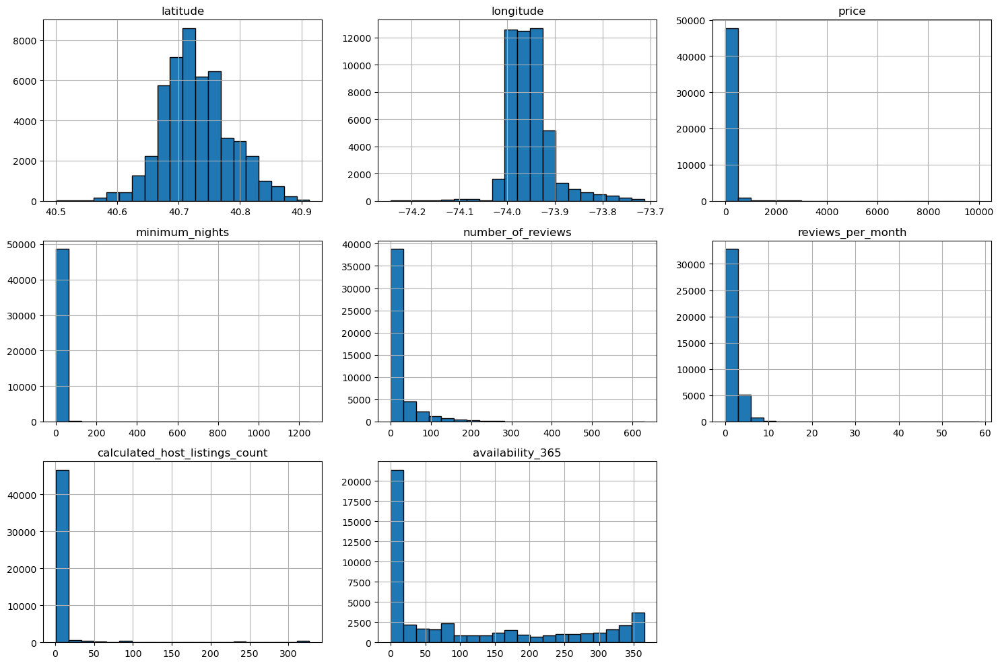

In [16]:
# Базовая статистика и распределения признако

import matplotlib.pyplot as plt

NUM_COLUMS = data.select_dtypes(include=['int64', 'float64']).columns

data.hist(bins=20, figsize=(15, 10), edgecolor='black')
plt.tight_layout()
plt.show()

#### Не сразу заметил, но среди цен есть значения = 0. Скорее всего невалидное объявление, всего таких значени 11. Удалим их.

<Axes: >

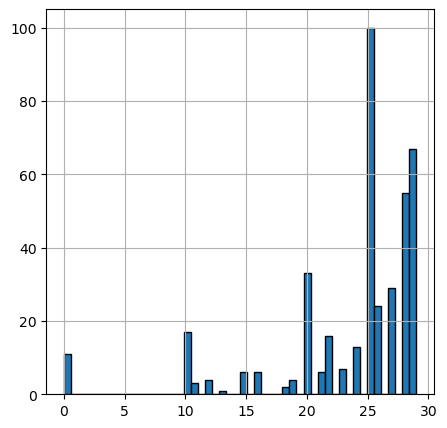

In [18]:
lowcost = data[data['price'] < 30]
lowcost['price'].hist(bins=50, figsize=(5, 5), edgecolor='black')

<Axes: >

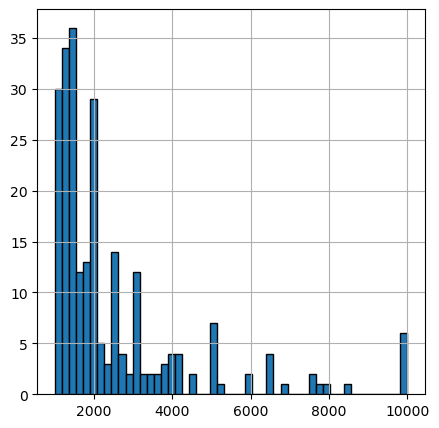

In [19]:
lowcost = data[data['price'] > 1000]
lowcost['price'].hist(bins=50, figsize=(5, 5), edgecolor='black')

In [20]:
data = data[(data['price'] > 0) & (data['price'] < float('inf'))]

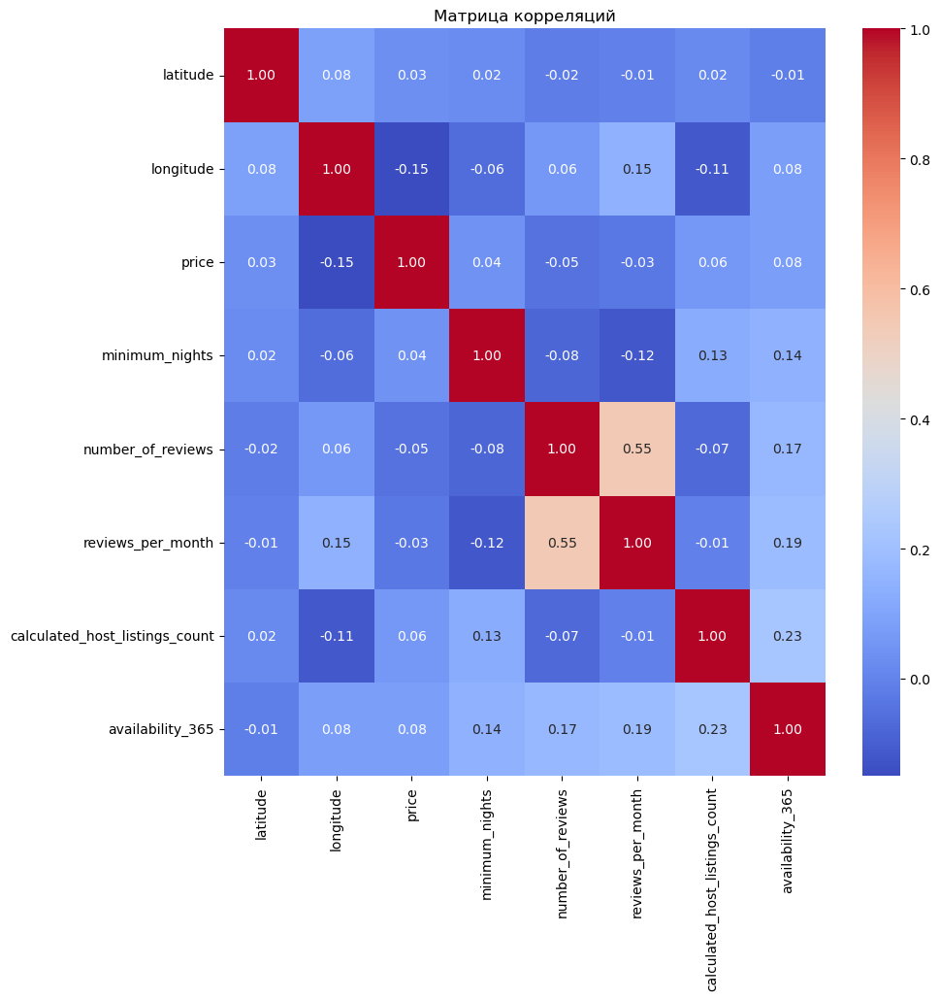

In [21]:
import seaborn as sns

def show_coor_mat(df, selected_cols, size = (10, 10)):
    # Вычисление корреляции
    correlation_matrix = df[selected_cols].corr()
    
    # Визуализация матрицы корреляций
    plt.figure(figsize=size)
    sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm", cbar=True)
    plt.title("Матрица корреляций")
    plt.show()

show_coor_mat(data, NUM_COLUMS)

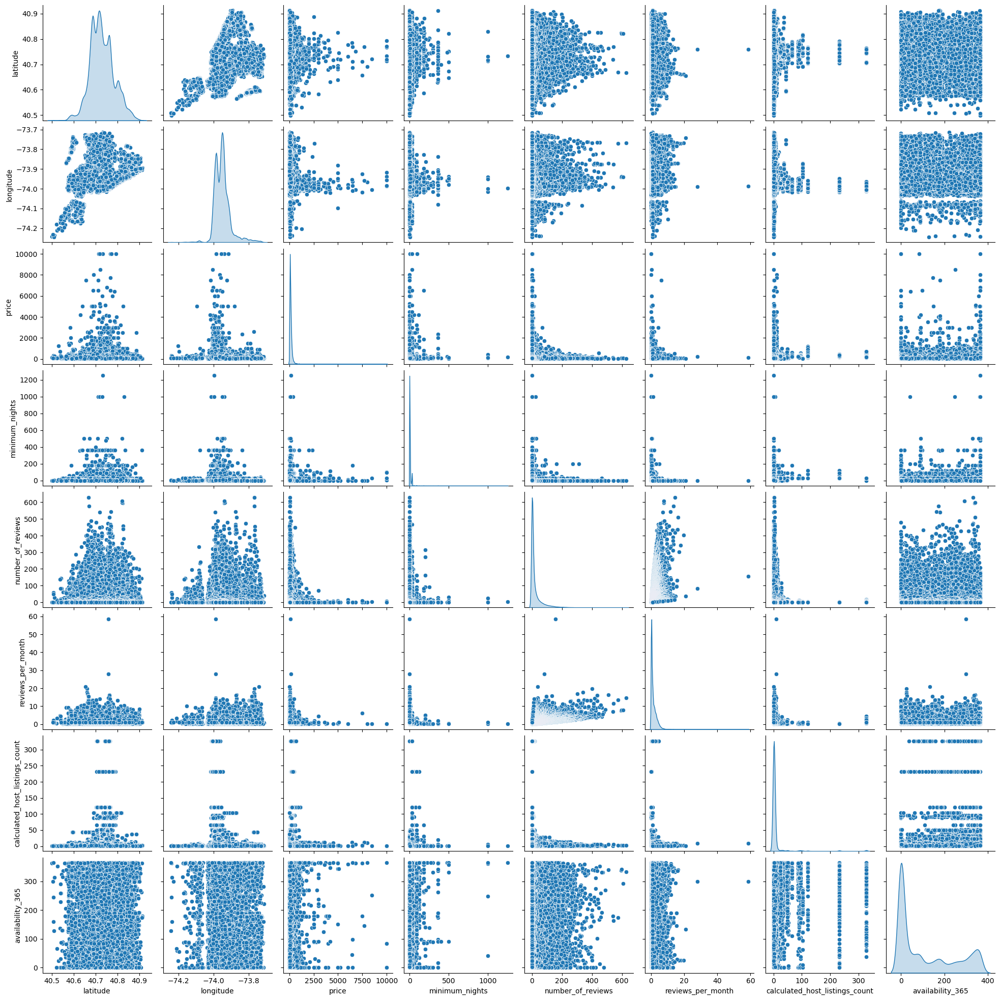

In [23]:
sns.pairplot(data[NUM_COLUMS], diag_kind='kde')
plt.show()

### Рассмотри как зависит ряд признаков от типа сдаваемого помещения и района. Также для высоких цен отдельно.

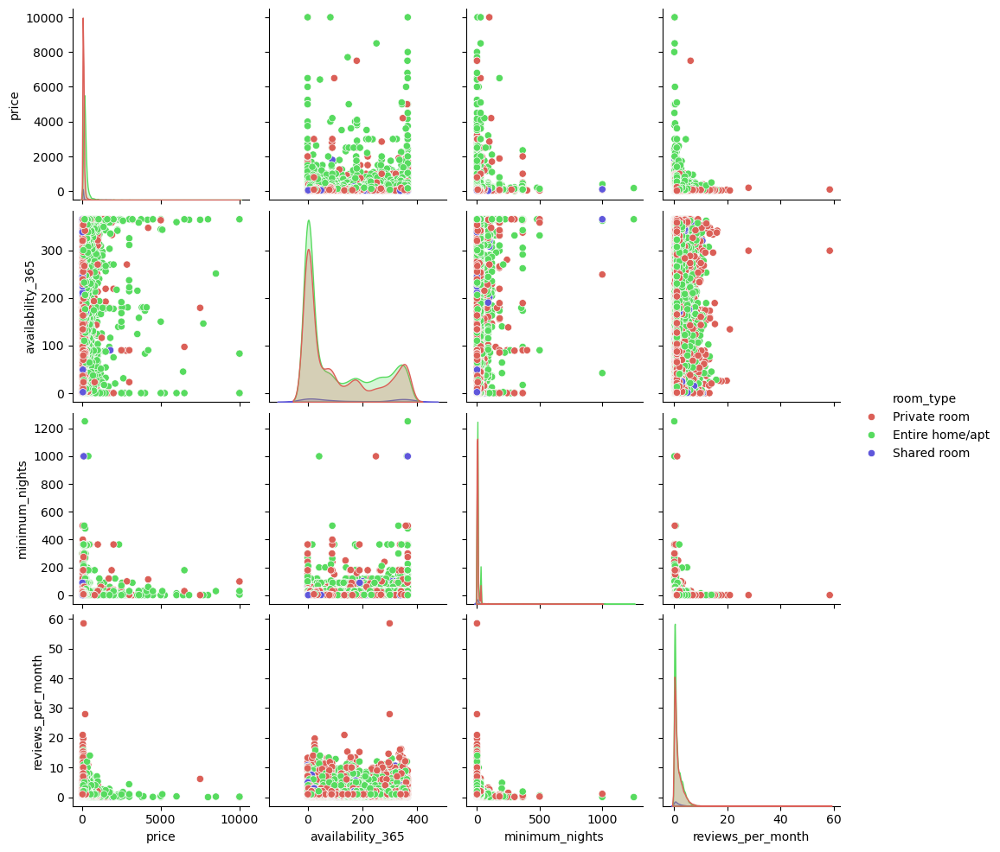

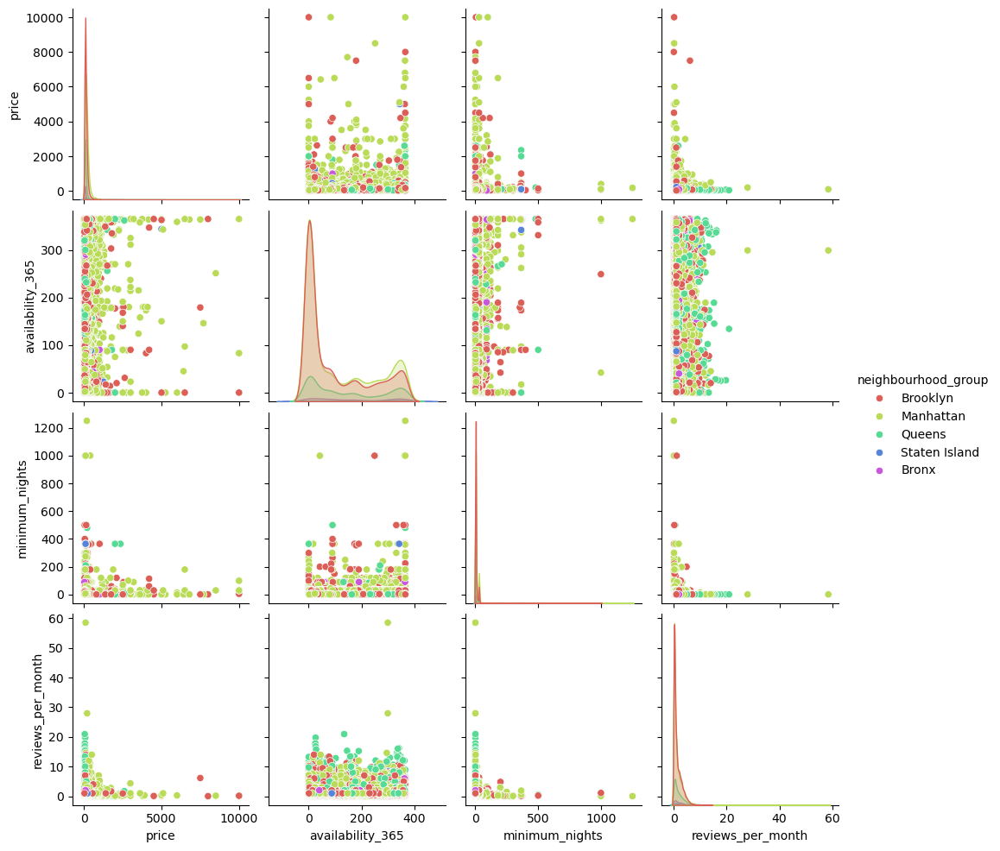

In [28]:
def show_pairplots(data, hue_cols, selected_cols = None, palette='hls'):
    if selected_cols is None:
        selected_cols = ['price',  "availability_365", 'minimum_nights', 'reviews_per_month', 'room_type', 'neighbourhood_group']

    for hue in hue_cols:
        sns.pairplot(data[selected_cols], hue=hue, diag_kind='kde', palette=palette)
        plt.show()

show_pairplots(data, hue_cols = ['room_type'])
show_pairplots(data, hue_cols = ['neighbourhood_group'])

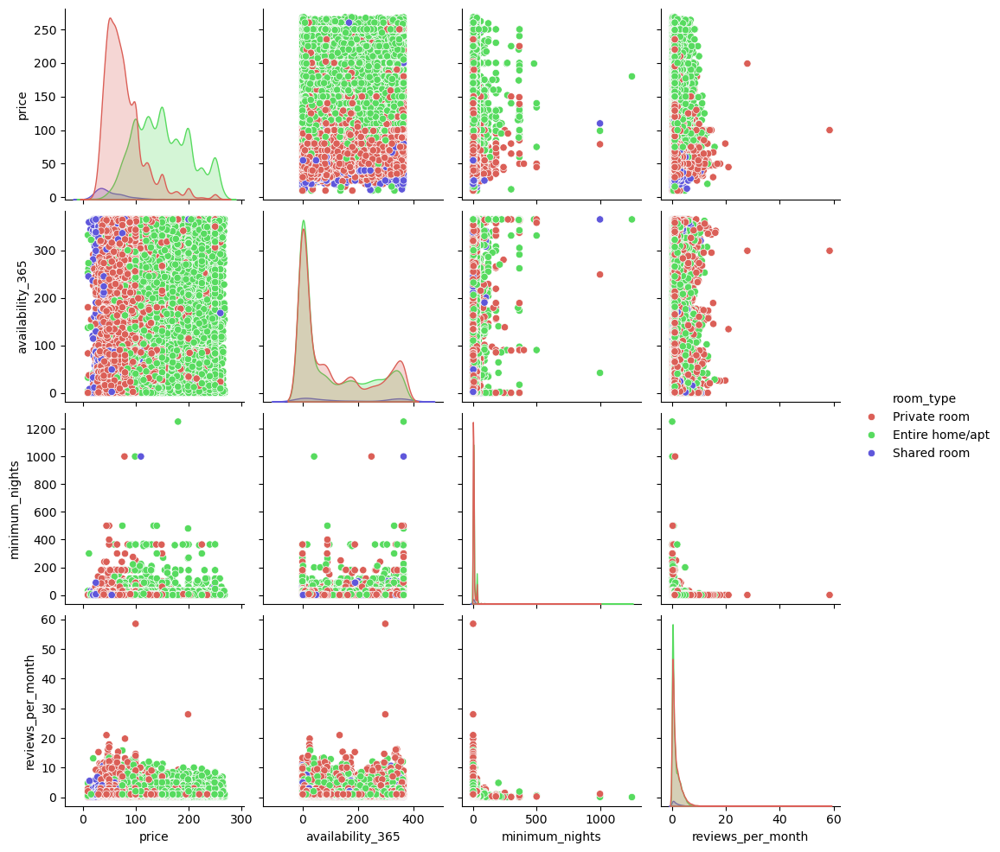

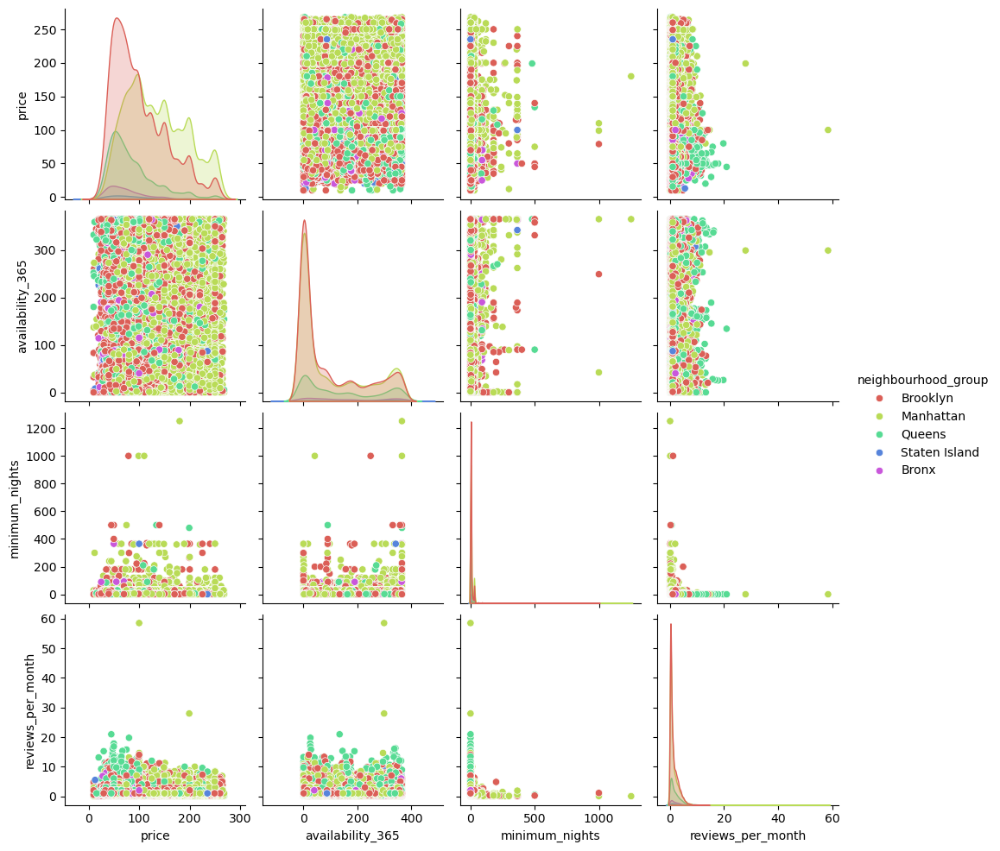

In [29]:
data_lowprice = data[data['price'] < data['price'].quantile(0.9)]

show_pairplots(data_lowprice, hue_cols = ['room_type'])
show_pairplots(data_lowprice, hue_cols = ['neighbourhood_group'])

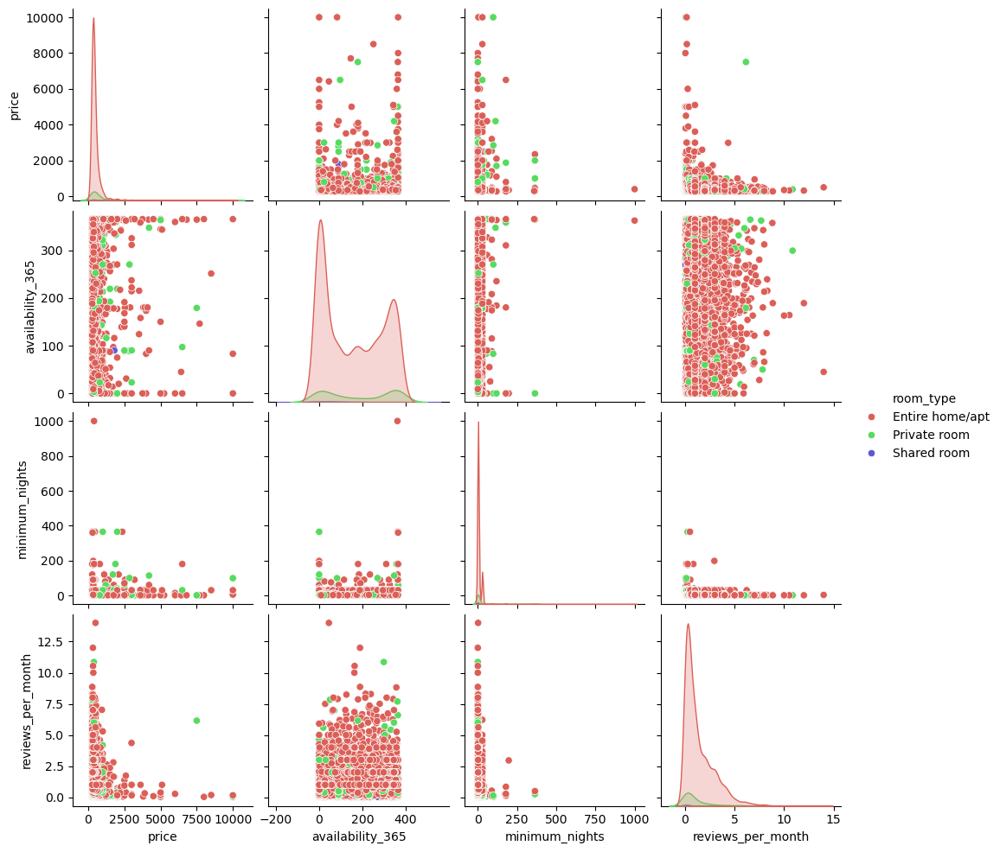

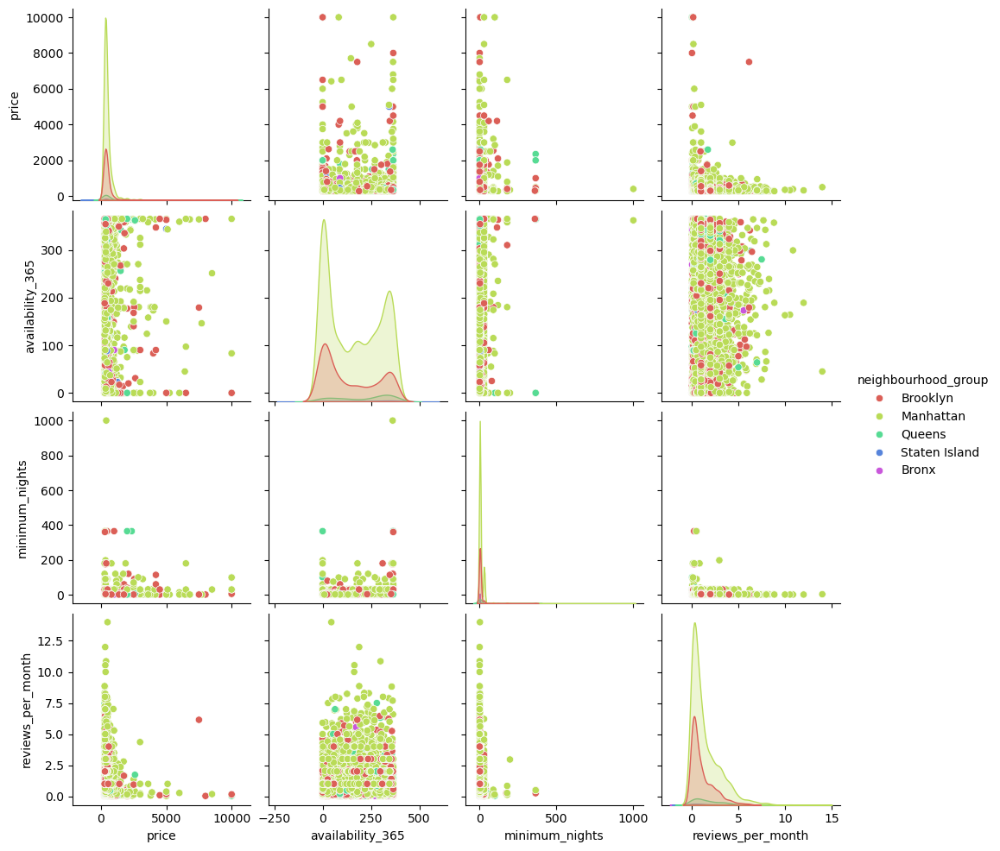

In [30]:
data_highprice = data[data['price'] >= data['price'].quantile(0.9)]

show_pairplots(data_highprice, hue_cols = ['room_type'])
show_pairplots(data_highprice, hue_cols = ['neighbourhood_group'])

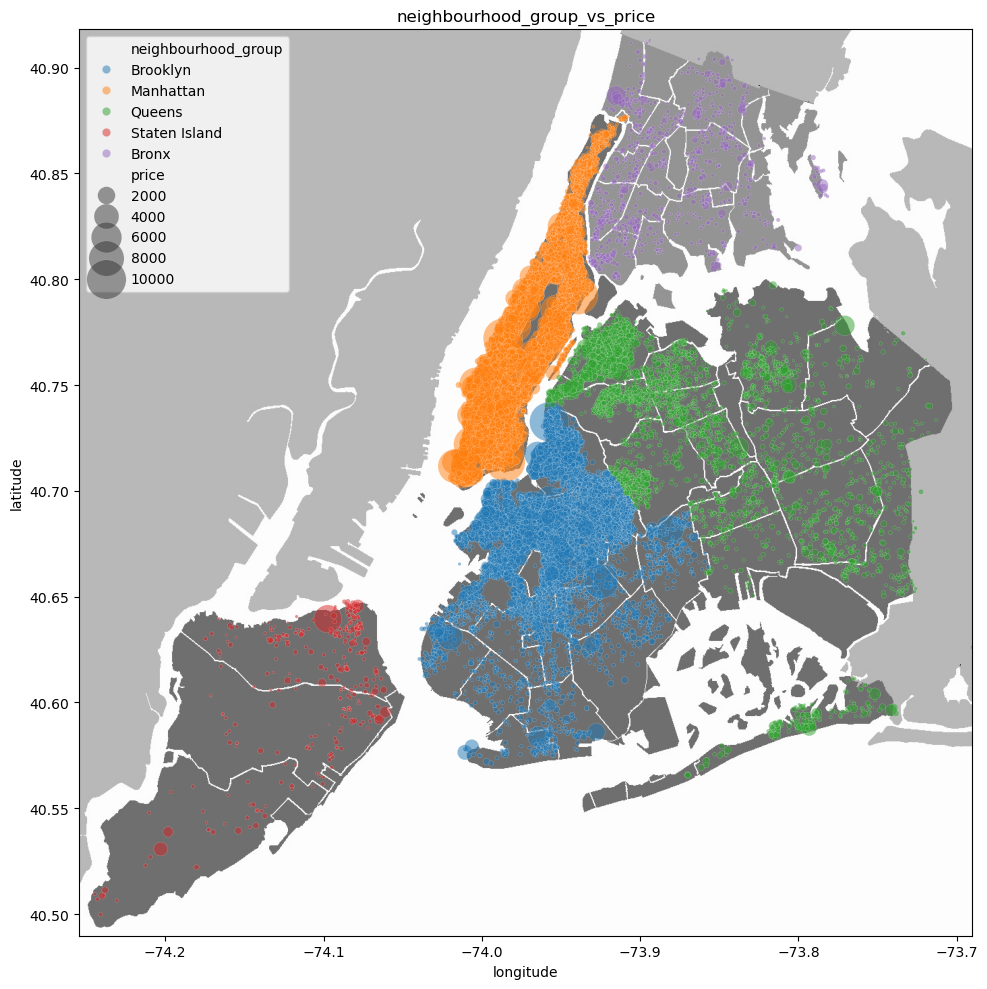

In [32]:
from PIL import Image

def show_map(df, hue_col, point_size_col, sizes=(5, 200), points = None):
    img = Image.open('dataset/New_York_City_.png')
    
    fig, ax = plt.subplots(figsize=(10, 10))
    
    ax.imshow(img, extent=[df['longitude'].min() - 0.01, df['longitude'].max() + 0.023,
                           df['latitude'].min() - 0.01, df['latitude'].max() + 0.005], aspect='auto')
    
    sns.scatterplot(x='longitude', y='latitude', hue=hue_col, 
                    size=point_size_col, sizes=(1, 800), alpha=0.5, data=df, ax=ax)
    if points is not None:
        for point in points:
            plt.scatter(point[0], point[1], color='green', s=100, marker='x')
    plt.title(hue_col + "_vs_" + point_size_col)
    plt.xlabel('longitude')
    plt.ylabel('latitude')
    plt.tight_layout()
    plt.show()

show_map(data, "neighbourhood_group", "price")

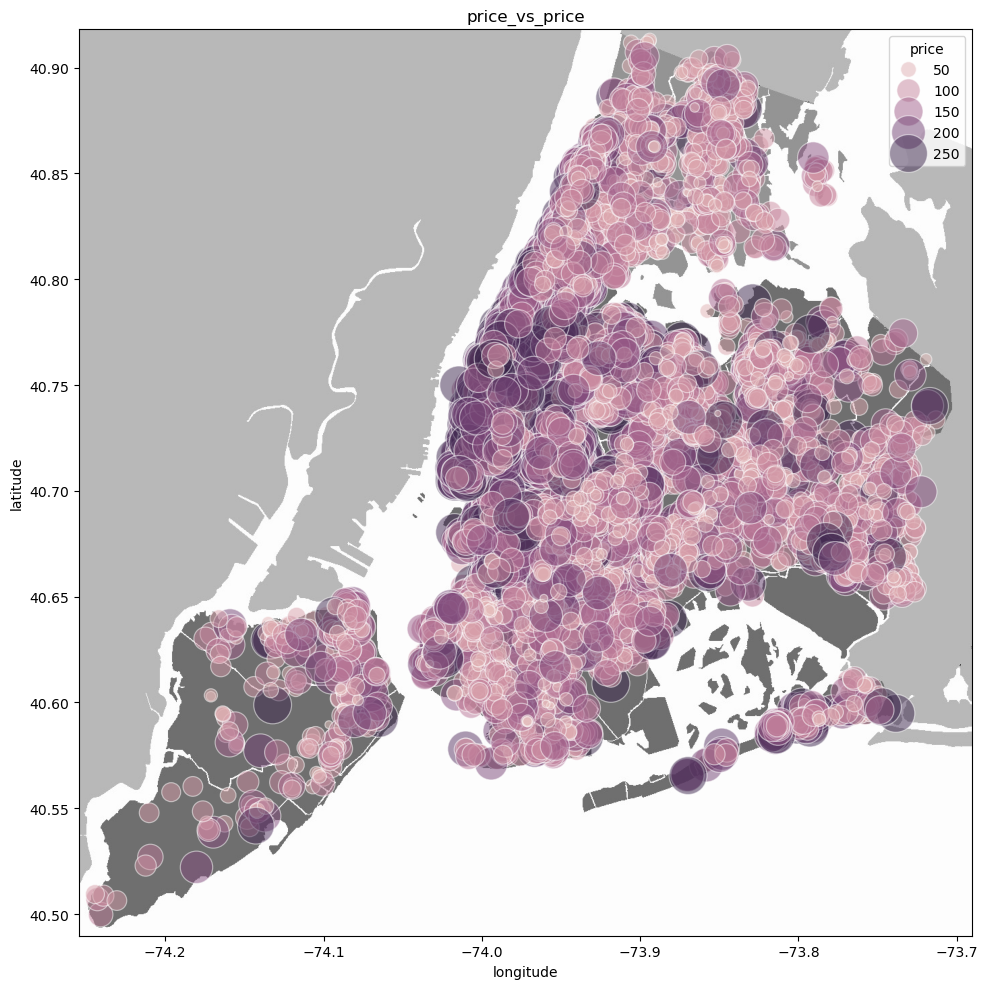

In [33]:
show_map(data_lowprice, "price", "price", sizes=(1, 250))

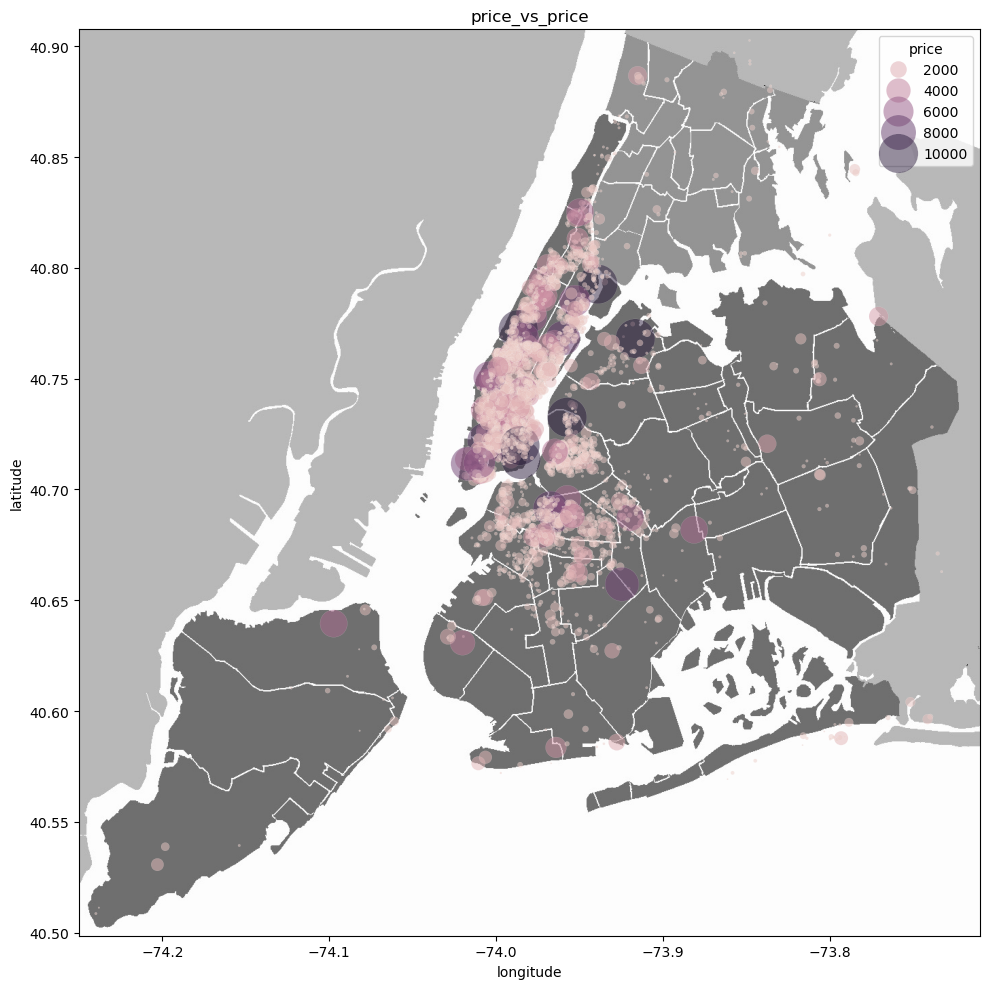

In [34]:
show_map(data_highprice, "price", "price")

In [35]:
# !pip install geopy

In [36]:
from geopy.distance import geodesic
import numpy as np

def calculate_distance(lat1, lon1, lat2, lon2):
    return geodesic((lat1, lon1), (lat2, lon2)).km

def add_distance_to_center(df):
    # data mean 40.758896,  −73.985130.
    # Координаты центра Нью-Йорка: широта —  40.7127837, долгота —  −74.0059413. 
    # Координаты центра Times Square: широта —  40.758895, долгота —  −73.985131
    # Манхеттен 40.776676, -73.971321
    manhattan_center_lat = 40.776676
    manhattan_center_lon = -73.971321
    
    df['distance_to_center'] = df.apply(lambda row: calculate_distance(row['latitude'],
                                                                       row['longitude'],
                                                                       manhattan_center_lat,
                                                                       manhattan_center_lon),
                                        axis=1)
    return df

In [37]:
from typing import Optional
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.model_selection import train_test_split

def ecode_one_hot(data: pd.DataFrame):
    return pd.get_dummies(data, columns=['room_type', 'neighbourhood_group', 'neighbourhood'], drop_first=True)

def encode_labels(data: pd.DataFrame):
    label_encoder = LabelEncoder()
    data['room_type'] = label_encoder.fit_transform(data['room_type'])
    data['neighbourhood_group'] = label_encoder.fit_transform(data['neighbourhood_group'])
    data['neighbourhood'] = label_encoder.fit_transform(data['neighbourhood'])
    return data

def proc(df, target = 'price', scaler = None, test_size = 0.3, rand = 42): # Или RobustScaler()
    # Разделение данных на признаки и целевую переменную
    X = df.drop(columns=target)
    y = df[target]
    
    # Деление выборки на тренировочную и тестовую части
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=rand)

    if scaler is not None:
        X_train = scaler.fit_transform(X_train)
        X_test = scaler.transform(X_test)

    return X_train, X_test, y_train, y_test

def prepare_data(raw_data: pd.DataFrame,
                 reviews_per_month_nan: float,
                 price_threshold: Optional[tuple] = None,
                 one_hot = False,
                 add_features = False) :
    data = raw_data.copy()
    data = data.drop(['id', 'name', 'host_id', 'host_name', 'last_review'], axis=1)
    data.drop_duplicates(inplace=True)

    if add_features:
        data = add_distance_to_center(data)
    
    data['reviews_per_month'] = data['reviews_per_month'].fillna(reviews_per_month_nan)
    
    if price_threshold is not None:
        lower_bound, upper_bound = price_threshold
        data = data[(data['price'] > lower_bound) & (data['price'] < upper_bound)]

    if one_hot:
        data = ecode_one_hot(data)
    else:
        data = encode_labels(data)

    size_diff = len(raw_data) - len(data)
    perc = size_diff / len(raw_data) * 100
    print(f"Dropped rows: {size_diff}, perc % : {perc:.4f}")
    return data

In [38]:
raw_data = pd.read_csv('dataset/AB_NYC_2019.csv')
data_enc = prepare_data(raw_data, reviews_per_month_nan = 0, add_features = True, price_threshold = (0, float('inf')))

Dropped rows: 11, perc % : 0.0225


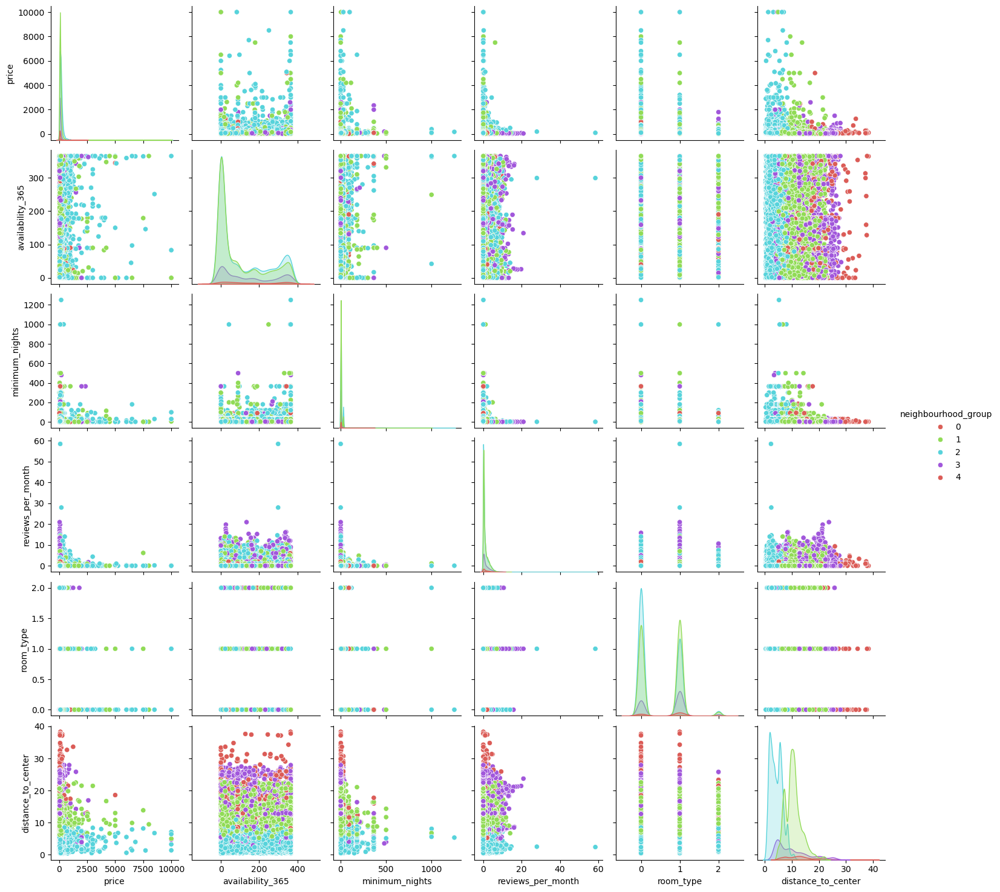

In [39]:
selected_cols = ['price',  "availability_365", 'minimum_nights', 'reviews_per_month', 'room_type', 'neighbourhood_group', 'distance_to_center']
show_pairplots(data_enc, hue_cols = ['neighbourhood_group'], selected_cols = selected_cols)

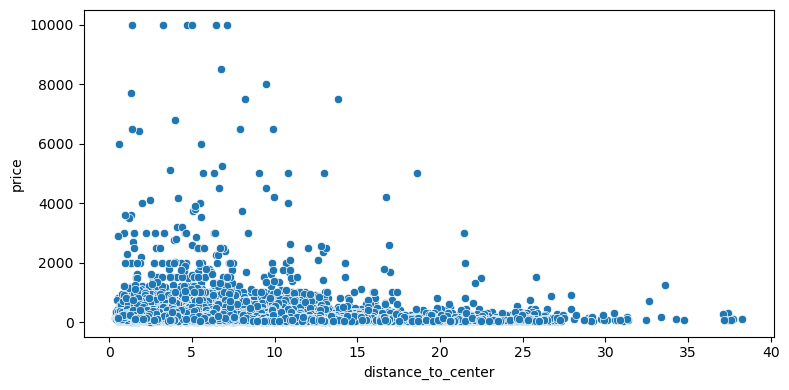

In [40]:
# Визуализация расстояние до центра
plt.figure(figsize=(8, 4))

sns.scatterplot(x='distance_to_center', y='price', data=data_enc)
plt.tight_layout()
plt.show()

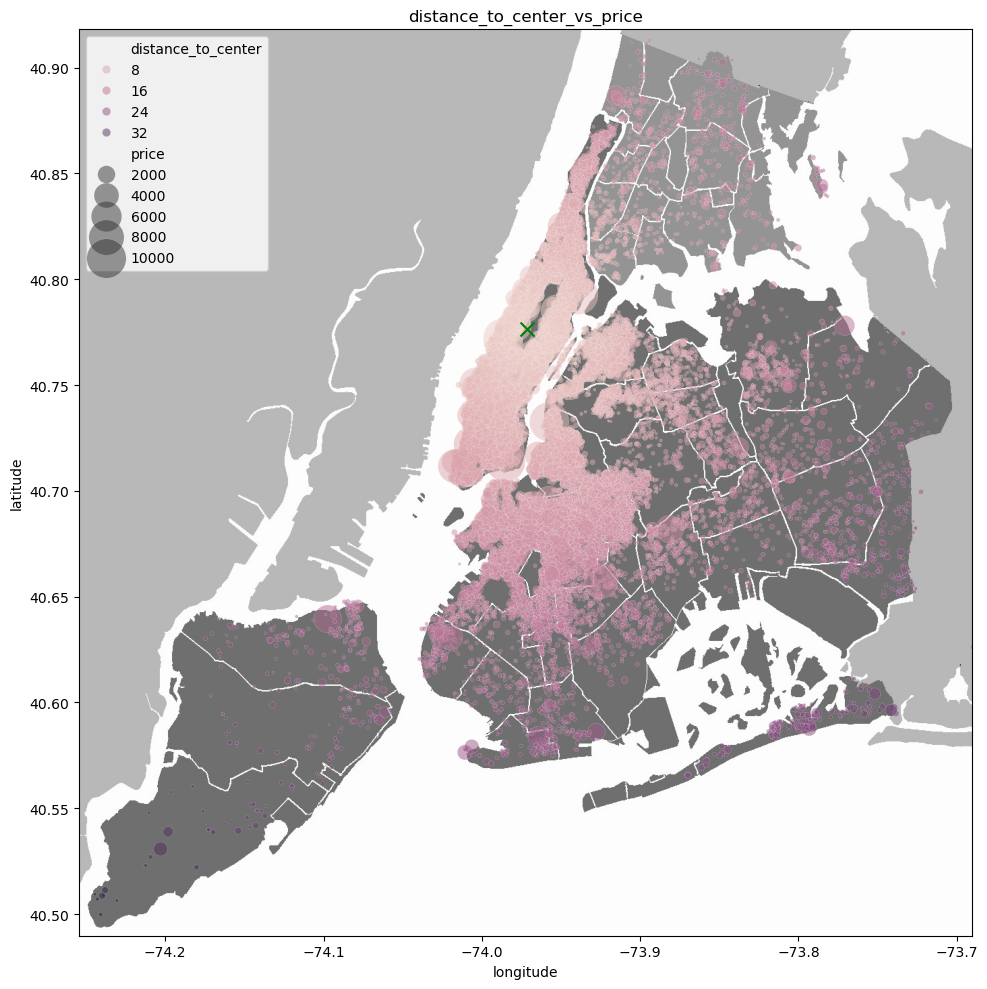

In [41]:
show_map(data_enc, "distance_to_center", "price", sizes=(0, 1) ,points=[(-73.971321, 40.776676)])

# Часть 2. Preprocessing & Feature Engineering


Ваша цель — получить как можно более высокие метрики качества (можно взять несколько, R2, MAE, RMSE), сконцентрировавшись на преобразовании признаков.


Опробуйте различные техники:

работа с категориальными переменными (можно начать с dummy);
замена аномалий;
различные варианты шкалирования непрерывных переменных (StandardScaler, RobustScaler и т. д.);
обратите внимание на распределение целевой переменной, возможно, с ней тоже можно поработать;

Попробуйте на основании имеющихся переменных создать новые, которые могли бы улучшить качество модели. Например, можно найти координаты Манхэттена (самого дорогого района) и при помощи широты и долготы, а также евклидова расстояния создать новую переменную — расстояние от квартиры до этого района. Возможно, такой признак будет работать лучше, чем просто широта и долгота.

#### Загрузим сначала без обрезки выбросов. Без нормализации данных. Попробуем применить StandardScaler. Пусть nan будет средним по палате

LabelEncoder метод плохо подходит для многозначных категорий. У room_type не должно быть связей больше\меньше в зависимости от типа арендного жилья. Комната с типом "Entire home/apartment" ближе к типу "Private room", чем к "Shared room", хотя это неверное предположение. Категории здесь равнозначны и не имеют естественной иерархии.

In [44]:
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error
from xgboost import XGBRegressor
from math import sqrt

def find_correlated_columns(corrmatrix, threshold = 0.7, up_threshold = 1):
    result = []
    checked_cols = []
    most_correlated_cols = []
    for col in corrmatrix.columns:
        correlated_cols = corrmatrix[(abs(corrmatrix[col]) > threshold) & (abs(corrmatrix[col]) < up_threshold) & (corrmatrix[col].index != col)].index.tolist()
        
        if len(correlated_cols) == 0:
            continue

        checked_cols.append(col)
        for corr_col in correlated_cols:
            if corr_col not in checked_cols:
                most_correlated_cols.append(col)
                most_correlated_cols.append(corr_col)
                result.append((col, corr_col, corrmatrix[col][corr_col]))
    return result, set(most_correlated_cols)

def fit(X_train, X_test, y_train, y_test, models):
    metrics = pd.DataFrame(columns=['method', 'MAE_train', 'RMSE_train', 'R2_train', 'MAE_test', 'RMSE_test', 'R2_test'])
    predictions = {}
    for name, model in models.items():
        model.fit(X_train, y_train)

        train_predictions = model.predict(X_train)

        mae = mean_absolute_error(y_train, train_predictions)
        rmse = sqrt(mean_squared_error(y_train, train_predictions))
        r2 = r2_score(y_train, train_predictions)

        predictions[name] = model.predict(X_test)

        mae_t = mean_absolute_error(y_test, predictions.get(name))
        rmse_t = sqrt(mean_squared_error(y_test, predictions.get(name)))
        r2_t = r2_score(y_test, predictions.get(name))
        metrics.loc[len(metrics)] = [name, mae, rmse, r2, mae_t, rmse_t, r2_t]
    
    return predictions, metrics

def display_metrics(metrics):
    display(metrics.style.format({'MAE_train': '{:.4f}', 'RMSE_train': '{:.4f}', 'R2_train': '{:.4f}',
                                 'MAE_test': '{:.4f}', 'RMSE_test': '{:.4f}', 'R2_test': '{:.4f}'}))
class FitResult:
    def __init__(self, X_train, X_test, y_train, y_test, predictions, metrics):
        self.X_train = X_train
        self.X_test = X_test
        self.y_train = y_train
        self.y_test = y_test
        self.predictions = predictions
        self.metrics = metrics

def pipeline(data, models, scaler = None):
    X_train, X_test, y_train, y_test = proc(data, scaler = scaler)
    predictions, metrics = fit(X_train, X_test, y_train, y_test, models)
    display_metrics(metrics)

    result = FitResult(X_train, X_test, y_train, y_test, predictions, metrics)
    return result

In [45]:
raw_data = pd.read_csv('dataset/AB_NYC_2019.csv')

In [46]:
models = {
    'Linear Regression': LinearRegression(),
    'Decision Tree Regressor': DecisionTreeRegressor(random_state=42),
    'Random Forest Regressor': RandomForestRegressor(random_state=42),
    'Gradient Boosting Regressor': GradientBoostingRegressor(random_state=42),
    'XGBoost Regressor': XGBRegressor(objective='reg:squarederror', random_state=42)
}

scaler = StandardScaler()
data = prepare_data(raw_data,
                    reviews_per_month_nan = 0,
                    price_threshold = (1, float('inf')),
                    one_hot = True)

result = pipeline(data, models, scaler)

Dropped rows: 11, perc % : 0.0225


,method,MAE_train,RMSE_train,R2_train,MAE_test,RMSE_test,R2_test
0,Linear Regression,72.8602,242.6115,0.1086,175071188642.8981,8667274390455.1660,-1967178928813031292928.0000
1,Decision Tree Regressor,0.0015,0.1911,1.0000,88.8349,320.4238,-1.6886
2,Random Forest Regressor,25.4358,91.8175,0.8723,66.2990,191.2657,0.0420
3,Gradient Boosting Regressor,66.3661,212.3397,0.3172,65.6377,178.0231,0.1701
4,XGBoost Regressor,52.9765,129.1119,0.7475,68.4086,212.4053,-0.1814


In [47]:
# Добавим расстояние до центра
models = {
    'Linear Regression': LinearRegression(),
    'Decision Tree Regressor': DecisionTreeRegressor(random_state=42),
    'Random Forest Regressor': RandomForestRegressor(random_state=42),
    'Gradient Boosting Regressor': GradientBoostingRegressor(random_state=42),
    'XGBoost Regressor': XGBRegressor(objective='reg:squarederror', random_state=42)
}

scaler = RobustScaler()
data = prepare_data(raw_data,
                    reviews_per_month_nan = 0,
                    price_threshold = (1, float('inf')),
                    add_features = True,
                    one_hot = True)
result = pipeline(data, models, scaler)

Dropped rows: 11, perc % : 0.0225


,method,MAE_train,RMSE_train,R2_train,MAE_test,RMSE_test,R2_test
0,Linear Regression,72.8466,242.5532,0.1090,323296120.4319,24679726753.9470,-15949955156129208.0000
1,Decision Tree Regressor,0.0015,0.1911,1.0000,87.4926,300.5061,-1.3648
2,Random Forest Regressor,25.4464,91.7406,0.8725,66.1909,192.1641,0.0330
3,Gradient Boosting Regressor,66.3276,212.9747,0.3131,65.6340,177.8695,0.1715
4,XGBoost Regressor,52.5721,122.6450,0.7722,67.8747,207.0158,-0.1222


#### Дистанци может и влияет на цену, но понять по какой причине выставлена цена сложно. Есть символические miт max цен - это 0 и 10 000 у.е., которые скорее всего не соответсвуют действительности. Насколько адекватна цена в 10 у.е. (минимальная отличная от нуля) тоже вопрос. На карте тоже можно видеть, как цена в несколько тысяч у.е. есть и в недорогих районах 

In [49]:
# Отключим OHE, ограничим цены

models = {
    'Linear Regression': LinearRegression(),
    'Decision Tree Regressor': DecisionTreeRegressor(random_state=42),
    'Random Forest Regressor': RandomForestRegressor(random_state=42),
    'Gradient Boosting Regressor': GradientBoostingRegressor(random_state=42),
    'XGBoost Regressor': XGBRegressor(objective='reg:squarederror', random_state=42)
}

scaler = RobustScaler()
data = prepare_data(raw_data,
                    reviews_per_month_nan = 0,
                    add_features = True,
                    price_threshold = (10, 9000),
                    one_hot = False)
result = pipeline(data, models, scaler)

Dropped rows: 34, perc % : 0.0695


,method,MAE_train,RMSE_train,R2_train,MAE_test,RMSE_test,R2_test
0,Linear Regression,73.7460,203.8121,0.1145,72.0185,194.8079,0.1211
1,Decision Tree Regressor,0.0015,0.1912,1.0000,86.0996,274.9869,-0.7513
2,Random Forest Regressor,24.2987,75.1094,0.8797,64.9935,193.2051,0.1355
3,Gradient Boosting Regressor,63.7669,179.3477,0.3144,64.0618,187.2709,0.1878
4,XGBoost Regressor,49.2812,104.6025,0.7668,65.5734,187.8021,0.1832


#### Обрежем выбросы самых высоких цен по квантилю

In [51]:

models = {
    'Linear Regression': LinearRegression(),
    'Decision Tree Regressor': DecisionTreeRegressor(random_state=42),
    'Random Forest Regressor': RandomForestRegressor(random_state=42),
    'Gradient Boosting Regressor': GradientBoostingRegressor(random_state=42),
    'XGBoost Regressor': XGBRegressor(objective='reg:squarederror', random_state=42)
}

scaler = RobustScaler()
price_upper_bound = raw_data['price'].quantile(0.99)
print("price_upper_bound :", price_upper_bound)

price_lower_bound = 9
print("price_lower_bound :", price_lower_bound)

data = prepare_data(raw_data,
                    reviews_per_month_nan = raw_data['reviews_per_month'].std(),
                    price_threshold = (price_lower_bound, price_upper_bound),
                    add_features = True,
                    one_hot = False)
result = pipeline(data, models, scaler)

price_upper_bound : 799.0
price_lower_bound : 9
Dropped rows: 503, perc % : 1.0287


,method,MAE_train,RMSE_train,R2_train,MAE_test,RMSE_test,R2_test
0,Linear Regression,53.3063,82.8695,0.3466,53.4374,83.7696,0.3529
1,Decision Tree Regressor,0.0015,0.1921,1.0000,61.2434,103.5786,0.0107
2,Random Forest Regressor,16.9100,27.6416,0.9273,45.7526,74.3774,0.4899
3,Gradient Boosting Regressor,45.7257,74.3072,0.4747,46.6245,75.9777,0.4677
4,XGBoost Regressor,36.8179,58.7317,0.6718,45.2451,73.5427,0.5013


#### Применим логариф к данным

In [53]:
models = {
    'Linear Regression': LinearRegression(),
    'Decision Tree Regressor': DecisionTreeRegressor(random_state=42),
    'Random Forest Regressor': RandomForestRegressor(random_state=42),
    'Gradient Boosting Regressor': GradientBoostingRegressor(random_state=42),
    'XGBoost Regressor': XGBRegressor(objective='reg:squarederror', random_state=42)
}

scaler = RobustScaler()
price_upper_bound = raw_data['price'].quantile(0.99)
print("price_upper_bound :", price_upper_bound)

price_lower_bound = 9
print("price_lower_bound :", price_lower_bound)

data = prepare_data(raw_data,
                    reviews_per_month_nan = raw_data['reviews_per_month'].std(),
                    price_threshold = (price_lower_bound, price_upper_bound),
                    add_features = True,
                    one_hot = False)
data['minimum_nights'] = np.log1p(data['minimum_nights'])
# data['number_of_reviews'] = np.log1p(data['number_of_reviews'])
# data['reviews_per_month'] = np.log1p(data['reviews_per_month'])
data['price'] = np.log1p(data['price'])
result = pipeline(data, models, scaler)

price_upper_bound : 799.0
price_lower_bound : 9
Dropped rows: 503, perc % : 1.0287


,method,MAE_train,RMSE_train,R2_train,MAE_test,RMSE_test,R2_test
0,Linear Regression,0.3369,0.4424,0.5316,0.3332,0.4382,0.5394
1,Decision Tree Regressor,0.0000,0.0013,1.0000,0.4039,0.5445,0.2887
2,Random Forest Regressor,0.1083,0.1460,0.9490,0.2904,0.3895,0.6360
3,Gradient Boosting Regressor,0.2973,0.3930,0.6305,0.2997,0.3975,0.6210
4,XGBoost Regressor,0.2423,0.3241,0.7486,0.2911,0.3884,0.6381


### Повторим последний эксперимент с другим рандомом

In [55]:
rand=27

models = {
    'Linear Regression': LinearRegression(),
    'Decision Tree Regressor': DecisionTreeRegressor(random_state=rand),
    'Random Forest Regressor': RandomForestRegressor(random_state=rand),
    'Gradient Boosting Regressor': GradientBoostingRegressor(random_state=rand),
    'XGBoost Regressor': XGBRegressor(objective='reg:squarederror', random_state=rand)
}

scaler = RobustScaler()
price_upper_bound = raw_data['price'].quantile(0.99)
print("price_upper_bound :", price_upper_bound)

price_lower_bound = 9
print("price_lower_bound :", price_lower_bound)

data = prepare_data(raw_data,
                    reviews_per_month_nan = raw_data['reviews_per_month'].std(),
                    price_threshold = (price_lower_bound, price_upper_bound),
                    add_features = True,
                    one_hot = False)
data['minimum_nights'] = np.log1p(data['minimum_nights'])
# data['number_of_reviews'] = np.log1p(data['number_of_reviews'])
# data['reviews_per_month'] = np.log1p(data['reviews_per_month'])
data['price'] = np.log1p(data['price'])
result = pipeline(data, models, scaler)

price_upper_bound : 799.0
price_lower_bound : 9
Dropped rows: 503, perc % : 1.0287


,method,MAE_train,RMSE_train,R2_train,MAE_test,RMSE_test,R2_test
0,Linear Regression,0.3369,0.4424,0.5316,0.3332,0.4382,0.5394
1,Decision Tree Regressor,0.0000,0.0013,1.0000,0.4031,0.5425,0.2939
2,Random Forest Regressor,0.1080,0.1458,0.9491,0.2900,0.3899,0.6354
3,Gradient Boosting Regressor,0.2973,0.3930,0.6305,0.2997,0.3975,0.6210
4,XGBoost Regressor,0.2423,0.3241,0.7486,0.2911,0.3884,0.6381


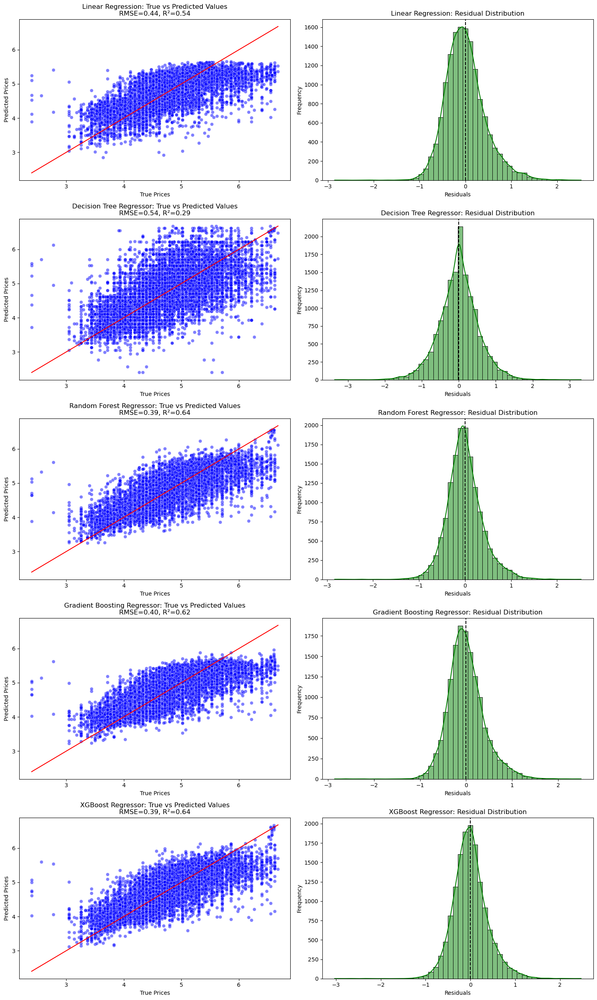

In [56]:
def plot_model_performance(fit_result: FitResult, models):
    fig, axes = plt.subplots(len(models), 2, figsize=(15, len(models)*5))

    for i, (model_name, model) in enumerate(models.items()):
        # # Предсказываем на тестовом наборе
        y_pred = fit_result.predictions.get(model_name)
 
        rmse = fit_result.metrics.loc[fit_result.metrics['method'] == model_name, 'RMSE_test'].values[0]
        r2 = fit_result.metrics.loc[fit_result.metrics['method'] == model_name, 'R2_test'].values[0]
        
        # Преобразуем Series в Numpy array и применяем flatten
        y_test_np = fit_result.y_test.values.flatten()
        
        # Первый график: True vs Predicted values
        ax_true_vs_pred = axes[i, 0]
        sns.scatterplot(x=y_test_np, y=y_pred, alpha=0.5, color="blue", ax=ax_true_vs_pred)
        ax_true_vs_pred.plot([min(y_test_np.min(), y_pred.min()), max(y_test_np.max(), y_pred.max())],
                             [min(y_test_np.min(), y_pred.min()), max(y_test_np.max(), y_pred.max())], color="red")
        ax_true_vs_pred.set_title(f"{model_name}: True vs Predicted Values\nRMSE={rmse:.2f}, R²={r2:.2f}")
        ax_true_vs_pred.set_xlabel("True Prices")
        ax_true_vs_pred.set_ylabel("Predicted Prices")
        
        # Второй график: Residual Plot
        residuals = y_test_np - y_pred
        ax_resid = axes[i, 1]
        sns.histplot(residuals, kde=True, bins=50, color="green", ax=ax_resid)
        ax_resid.axvline(x=0, color="black", linestyle="--")
        ax_resid.set_title(f"{model_name}: Residual Distribution")
        ax_resid.set_xlabel("Residuals")
        ax_resid.set_ylabel("Frequency")

    plt.tight_layout()
    plt.show()

plot_model_performance(result, models)

In [57]:
from sklearn.model_selection import cross_val_score, KFold

kfold = KFold(n_splits=5, shuffle=True, random_state=42)

# Для каждой модели выполняем кросс-валидацию и сохраняем результаты
cv_results = {}

X = result.X_train
y = result.y_train

for name, model in models.items():
    scores = cross_val_score(model, X, y.to_numpy(), cv=kfold, scoring='neg_mean_absolute_error')
    print(f'{name}: {np.mean(scores)}')
    cv_results[name] = np.mean(scores)

# Преобразуем отрицательные значения обратно в положительные
cv_results = {key: -value for key, value in cv_results.items()}

# Представляем результаты
print("\nКросс-валидационные результаты:")
for method, mae in cv_results.items():
    print(f"{method}: MAE = {mae:.4f}")

Linear Regression: -0.3370622626335111
Decision Tree Regressor: -0.4060387967240112
Random Forest Regressor: -0.2937389094801003
Gradient Boosting Regressor: -0.30111153782528105
XGBoost Regressor: -0.2939178170961199

Кросс-валидационные результаты:
Linear Regression: MAE = 0.3371
Decision Tree Regressor: MAE = 0.4060
Random Forest Regressor: MAE = 0.2937
Gradient Boosting Regressor: MAE = 0.3011
XGBoost Regressor: MAE = 0.2939


# Часть 3. Моделирование


Отложите 30% данных для тестирования.
Постройте модели простой линейной регрессии, RidgeCV, LassoCV и ElasticNetCV.
Измерьте качество каждой и визуализируйте важность признаков.
Сделайте интересные выводы :)

In [59]:
from sklearn.linear_model import LinearRegression, RidgeCV, LassoCV, ElasticNetCV

models = {
    'Linear Regression': LinearRegression(),
    'RidgeCV': RidgeCV(alphas=np.logspace(-3, 3, 10), cv=5),
    'LassoCV': LassoCV(alphas=np.logspace(-3, 3, 10)),
    'ElasticNetCV':ElasticNetCV(l1_ratio=[.1, .5, .7, .9, .95, .99, 1], alphas=np.logspace(-3, 3, 10))
}

scaler = RobustScaler()
price_upper_bound = raw_data['price'].quantile(0.99)
data = prepare_data(raw_data,
                    reviews_per_month_nan = raw_data['reviews_per_month'].std(),
                    price_threshold = (9, price_upper_bound),
                    add_features = True,
                    one_hot = True)

data['minimum_nights'] = np.log1p(data['minimum_nights'])
data['price'] = np.log1p(data['price'])

result = pipeline(data, models, scaler)

Dropped rows: 503, perc % : 1.0287


,method,MAE_train,RMSE_train,R2_train,MAE_test,RMSE_test,R2_test
0,Linear Regression,0.3120,0.4115,0.5947,1519.1711,129406.4065,-40170675329.0146
1,RidgeCV,0.3124,0.4119,0.5941,0.3127,0.4137,0.5895
2,LassoCV,0.3214,0.4229,0.5721,0.3200,0.4216,0.5735
3,ElasticNetCV,0.3151,0.4153,0.5873,0.3143,0.4153,0.5862


In [60]:
# Если выключить OHE
scaler = RobustScaler()
price_upper_bound = raw_data['price'].quantile(0.99)
data = prepare_data(raw_data,
                    reviews_per_month_nan = raw_data['reviews_per_month'].std(),
                    price_threshold = (9, price_upper_bound),
                    add_features = True,
                    one_hot = False)

data['minimum_nights'] = np.log1p(data['minimum_nights'])
data['price'] = np.log1p(data['price'])

result = pipeline(data, models, scaler)

Dropped rows: 503, perc % : 1.0287


,method,MAE_train,RMSE_train,R2_train,MAE_test,RMSE_test,R2_test
0,Linear Regression,0.3369,0.4424,0.5316,0.3332,0.4382,0.5394
1,RidgeCV,0.3369,0.4424,0.5316,0.3332,0.4382,0.5394
2,LassoCV,0.3369,0.4425,0.5315,0.3332,0.4382,0.5393
3,ElasticNetCV,0.3369,0.4424,0.5316,0.3331,0.4382,0.5394


In [61]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()
vif["Features"] = data.columns
vif["VIF"] = [variance_inflation_factor(data.values, i) for i in range(data.shape[1])]
print(vif)

                          Features            VIF
0              neighbourhood_group       6.940936
1                    neighbourhood       3.684817
2                         latitude  613265.959034
3                        longitude  617858.868949
4                        room_type       3.461592
5                            price     115.723923
6                   minimum_nights       5.016661
7                number_of_reviews       1.789333
8                reviews_per_month       2.715988
9   calculated_host_listings_count       1.197385
10                availability_365       2.128600
11              distance_to_center       6.345332


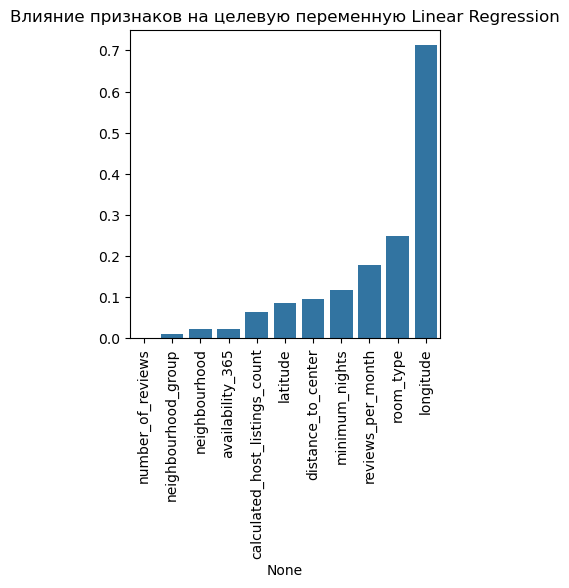

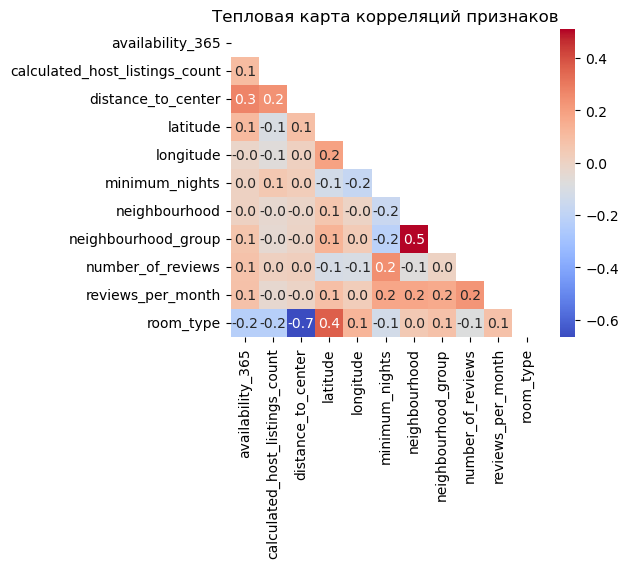

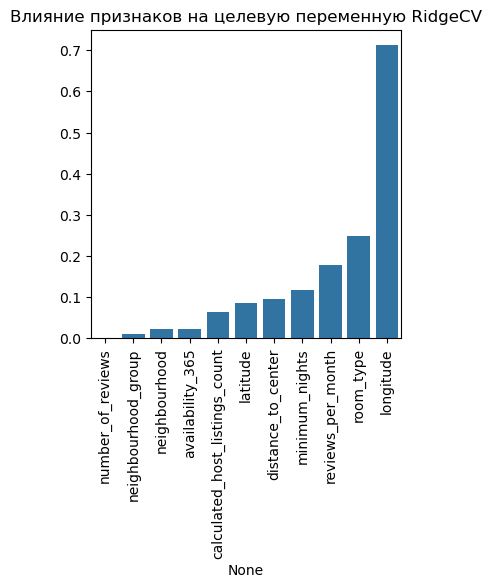

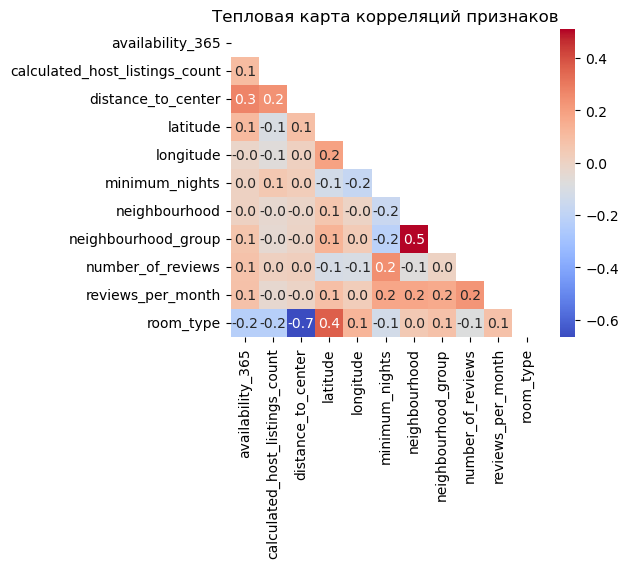

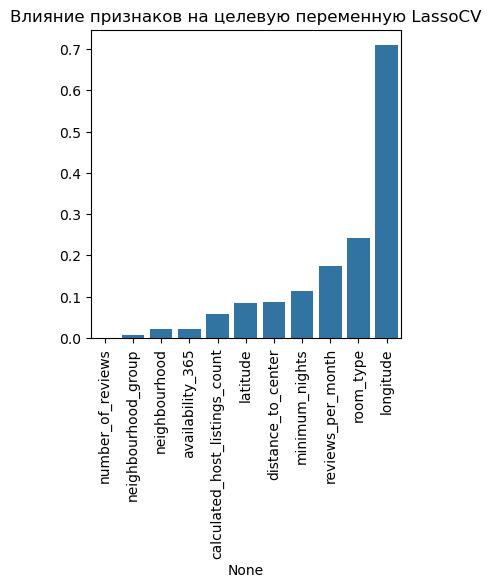

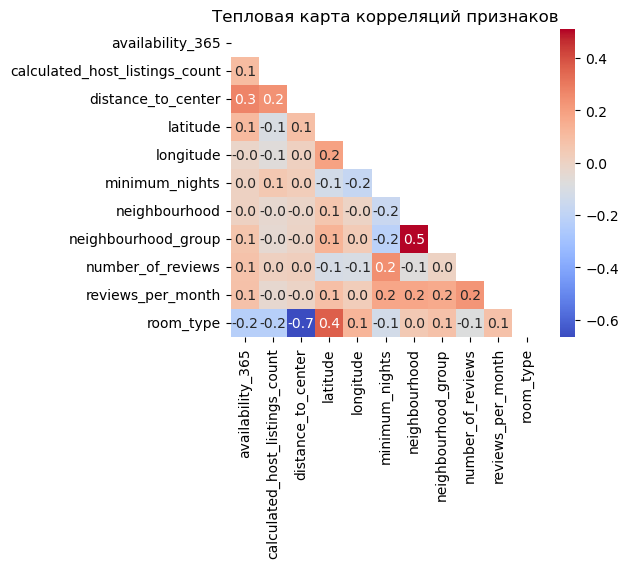

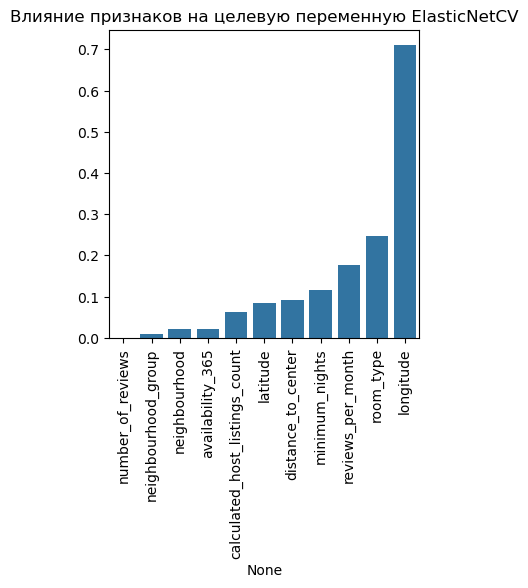

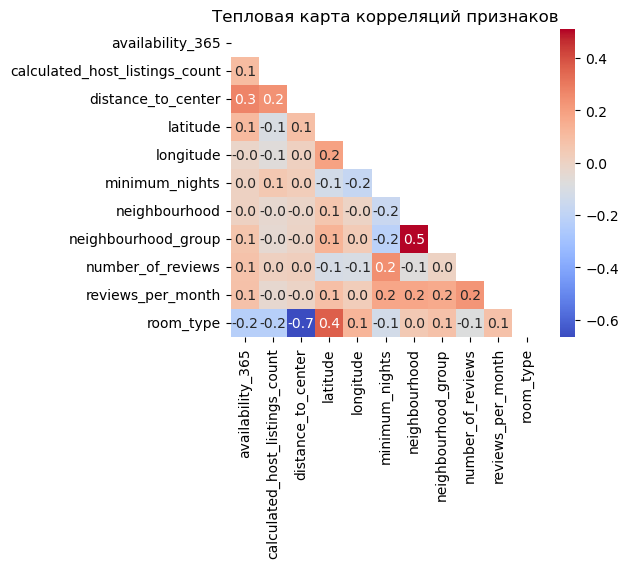

In [62]:
column_names = data.columns.difference(['price'])
X_train = pd.DataFrame(result.X_train, columns=column_names)
X_test = pd.DataFrame(result.X_test, columns=column_names)

for name, model in models.items():
    feature_importances = pd.Series(np.abs(model.coef_), index=X_train.columns)
    
    # Визуализация
    plt.figure(figsize=(4, 4))
    sns.barplot(x=feature_importances.sort_values().index, y=feature_importances.sort_values().values)
    plt.xticks(rotation=90)
    plt.title(f'Влияние признаков на целевую переменную {name}')
    plt.show()

    corr_matrix = X_train.corr()
    mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
    
    plt.figure(figsize=(5, 4))
    sns.heatmap(corr_matrix, mask=mask, annot=True, cmap='coolwarm', fmt='.1f')
    plt.title('Тепловая карта корреляций признаков')
    plt.show()

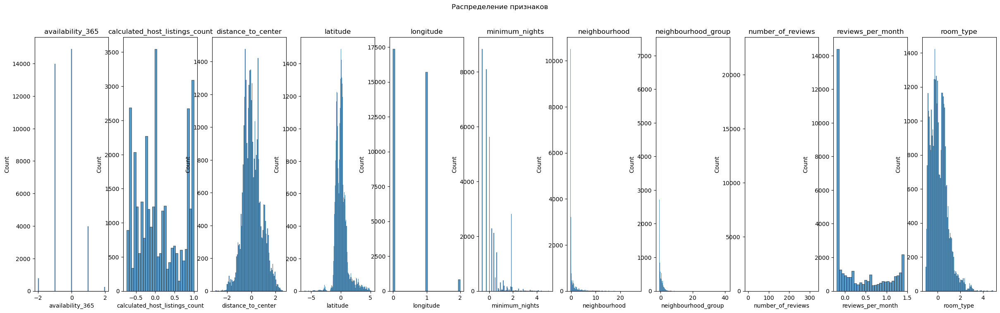

In [63]:
fig, axes = plt.subplots(ncols=len(X_train.columns), nrows=1, figsize=(30, 8))
for idx, feature in enumerate(X_train.columns):
    sns.histplot(X_train[feature], ax=axes[idx])
    axes[idx].set_title(feature)
plt.suptitle('Распределение признаков')
plt.show()

#### Сделайте интересные выводы :(
### Выводы:
Вероятно, причина схожести результатов c Linear Regression кроется в недостаточном уровне сложности фичей или естественной простоте решаемой модели. По сути был найден только один признак коррелирующий с ценой - дистанция до богатеньких домов. Но всё равно это не достаточно хороший призак. longitude более выражено влияет на обучение. Если смотреть на карту, то видно, что дорогие дома больше разбросаны по широте на севере города.

Только с искуственными манипуляциями с данными удалось что-то выжать в метриках - логарифмирование 'minimum_nights' и 'price' (подглядел в комментах к датасету). Где грань между подгоном данных к хорошим метрикам и реальным результатом? Цена в датасете пляшет, какие данные мусорные не понятно. Цена в 0, 10, 10000 уе символические, как на авито "Котята 1р". С отзывами может быть и накрутка ботами. Кроме удаленности от богатых районов цена может складываться от себестоимости помещения, дороговизны ремонта (почему и кроме Манхетена есть дорогие помещения), обслуживания придомовой территории и т.д. Возможно в датасете недостаточно данных влияющих на цену.

Убито много времени и нервов. Что можно сделать с фичами не знаю, что делал неправильно не знаю. Когда только изучаешь мл и сталкиваешься с таким - боль и разочарование. Хотел получить понимание перед итоговым проектом как надо, а похоже как не надо. Полностью согласен с этим комментом к датасету (https://www.kaggle.com/datasets/dgomonov/new-york-city-airbnb-open-data/discussion/443155). 